<a href="https://colab.research.google.com/github/Anjasfedo/data-analysis/blob/main/fuzzy_knn.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Euclidean distance equation

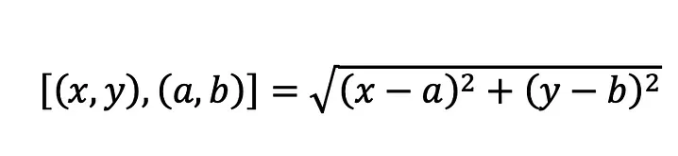

In [ ]:
import numpy as np
import pandas as pd

# Define the data points and their classes
data = [
    ((0.8, 0.8), 1),
    ((1.0, 1.0), 1),
    ((1.2, 0.8), 1),
    ((0.8, 1.2), 1),
    ((1.2, 1.2), 1),
    ((4.0, 3.0), 2),
    ((3.8, 2.8), 2),
    ((4.2, 2.8), 2),
    ((3.8, 3.2), 2),
    ((4.2, 3.2), 2),
    ((4.4, 2.8), 2),
    ((4.4, 3.2), 2),
    ((3.2, 0.4), 3),
    ((3.2, 0.7), 3),
    ((3.8, 0.5), 3),
    ((3.5, 1.0), 3),
    ((4.0, 1.0), 3),
    ((4.0, 0.7), 3),
]

# Convert to DataFrame
df = pd.DataFrame([{"x": x, "y": y, "class": cls} for (x, y), cls in data])

# Define Point class with optional label
class Point:
    def __init__(self, x: float, y: float, label: int = None, distance: float = None):
        self.x = x
        self.y = y
        self.label = label
        self.distance = distance  # Optional distance property

    def __repr__(self):
        return f"Point(x={self.x}, y={self.y}, label={self.label}, distance={self.distance})"

# Euclidean distance for 2D points
def euclidean_distance(X: Point, P: Point):
    return np.sqrt((X.x - P.x) ** 2 + (X.y - P.y) ** 2)

# kNN prediction function
def knn_predict(X_train, x_test, k=3):
    # Calculate distances and assign to each Point
    for point in X_train:
        point.distance = euclidean_distance(x_test, point)
    # Sort by distance and get k nearest
    sorted_points = sorted(X_train, key=lambda p: p.distance)
    k_nearest_points = sorted_points[:k]
    print("Distances:", [p.distance for p in k_nearest_points])
    print("Nearest labels:", [p.label for p in k_nearest_points])
    return k_nearest_points

# Create list of Point objects from DataFrame
points = [Point(row['x'], row['y'], row['class']) for _, row in df.iterrows()]

# Separate X_train and y_train
X_train = points
y_train = [p.label for p in X_train]

# Predict for P(3.0, 2.0) without label
P_test = Point(3.0, 2.0)

predicted_label = knn_predict(X_train, P_test, k=5)
print(f"Predicted class for P({P_test.x}, {P_test.y}): {predicted_label}")

Distances: [np.float64(1.118033988749895), np.float64(1.1313708498984758), np.float64(1.3152946437965907), np.float64(1.4142135623730951), np.float64(1.4142135623730951)]
Nearest labels: [np.float64(3.0), np.float64(2.0), np.float64(3.0), np.float64(2.0), np.float64(3.0)]
Predicted class for P(3.0, 2.0): [Point(x=3.5, y=1.0, label=3.0, distance=1.118033988749895), Point(x=3.8, y=2.8, label=2.0, distance=1.1313708498984758), Point(x=3.2, y=0.7, label=3.0, distance=1.3152946437965907), Point(x=4.0, y=3.0, label=2.0, distance=1.4142135623730951), Point(x=4.0, y=1.0, label=3.0, distance=1.4142135623730951)]


In [ ]:
predicted_label

[Point(x=3.5, y=1.0, label=3.0, distance=1.118033988749895),
 Point(x=3.8, y=2.8, label=2.0, distance=1.1313708498984758),
 Point(x=3.2, y=0.7, label=3.0, distance=1.3152946437965907),
 Point(x=4.0, y=3.0, label=2.0, distance=1.4142135623730951),
 Point(x=4.0, y=1.0, label=3.0, distance=1.4142135623730951)]

In [ ]:
def calculate_fuzzy(X: Point, label):
  upper = 0
  lower = 0
  for point in X:
    num = 0
    if point.label == label:
      num = 1
    else:
      num = 0
    upper += num / point.distance**2
    lower += 1 / point.distance**2
  print(upper/lower)
  return upper/lower

In [ ]:
res = 0
for i in [1.0, 2.0, 3.0]:
  res += calculate_fuzzy(predicted_label, i)

print(res)

0.0
0.40555066381548105
0.5944493361845189
1.0


In [ ]:
import numpy as np
from sklearn.neighbors import KNeighborsClassifier

# Your data
data = [
    ((0.8, 0.8), 1),
    ((1.0, 1.0), 1),
    ((1.2, 0.8), 1),
    ((0.8, 1.2), 1),
    ((1.2, 1.2), 1),
    ((4.0, 3.0), 2),
    ((3.8, 2.8), 2),
    ((4.2, 2.8), 2),
    ((3.8, 3.2), 2),
    ((4.2, 3.2), 2),
    ((4.4, 2.8), 2),
    ((4.4, 3.2), 2),
    ((3.2, 0.4), 3),
    ((3.2, 0.7), 3),
    ((3.8, 0.5), 3),
    ((3.5, 1.0), 3),
    ((4.0, 1.0), 3),
    ((4.0, 0.7), 3),
]

# Prepare data for sklearn
X = [list(xy) for xy, label in data]  # 2D features
y = [label for xy, label in data]

# Create and fit kNN classifier
neigh = KNeighborsClassifier(n_neighbors=3)
neigh.fit(X, y)

# Predict for (3.0, 2.0)
print("predict([[3.0, 2.0]]):", neigh.predict([[3.0, 2.0]]))

# Predict proba for (3.0, 2.0)
print("predict_proba([[3.0, 2.0]]):", neigh.predict_proba([[3.0, 2.0]]))

# Show the class labels order
print("Class order for predict_proba:", neigh.classes_)

predict([[3.0, 2.0]]): [3]
predict_proba([[3.0, 2.0]]): [[0.         0.33333333 0.66666667]]
Class order for predict_proba: [1 2 3]


In [ ]:
import numpy as np
from sklearn.neighbors import KNeighborsClassifier

# Example data (2D)
data = [
    ((0.8, 0.8), 1),
    ((1.0, 1.0), 1),
    ((1.2, 0.8), 1),
    ((0.8, 1.2), 1),
    ((1.2, 1.2), 1),
    ((4.0, 3.0), 2),
    ((3.8, 2.8), 2),
    ((4.2, 2.8), 2),
    ((3.8, 3.2), 2),
    ((4.2, 3.2), 2),
    ((4.4, 2.8), 2),
    ((4.4, 3.2), 2),
    ((3.2, 0.4), 3),
    ((3.2, 0.7), 3),
    ((3.8, 0.5), 3),
    ((3.5, 1.0), 3),
    ((4.0, 1.0), 3),
    ((4.0, 0.7), 3),
]
X = [xy for xy, label in data]
y = [label for xy, label in data]

# Fit sklearn KNN
k = 5
knn = KNeighborsClassifier(n_neighbors=k)
knn.fit(X, y)

# Predict for a new sample
sample = np.array([[3.0, 2.0]])

# Get k nearest neighbor info
distances, indices = knn.kneighbors(sample, n_neighbors=k)

# Get neighbor labels
neighbor_labels = np.array(y)[indices[0]]
neighbor_distances = distances[0]

# Fuzzy membership calculation for each class
classes = sorted(set(y))
fuzzy_memberships = []
for label in classes:
    upper = 0
    lower = 0
    for l, d in zip(neighbor_labels, neighbor_distances):
        weight = 1 / d**2 if d != 0 else 1e10  # Avoid division by zero
        upper += (1 if l == label else 0) * weight
        lower += weight
    fuzzy_memberships.append(upper / lower if lower != 0 else 0)

print("Classes:", classes)
print("Fuzzy memberships for sample", sample[0], ":", fuzzy_memberships)
print("Predicted class (fuzzy kNN):", classes[np.argmax(fuzzy_memberships)])
print("Scikit-learn predict_proba:", knn.predict_proba(sample))
print("Scikit-learn predict:", knn.predict(sample))

Classes: [1, 2, 3]
Fuzzy memberships for sample [3. 2.] : [np.float64(0.0), np.float64(0.40555066381548105), np.float64(0.5944493361845189)]
Predicted class (fuzzy kNN): 3
Scikit-learn predict_proba: [[0.  0.4 0.6]]
Scikit-learn predict: [3]


Local Binary Pattern

In [ ]:
import numpy as np

def local_binary_pattern(image, P=8, R=1):
    def get_pixel(img, x, y):
        if 0 <= x < img.shape[0] and 0 <= y < img.shape[1]:
            return img[x, y]
        return 0  # zero padding

    height, width = image.shape
    lbp = np.zeros_like(image, dtype=np.uint8)
    # Directions: starting from top-left, clockwise
    offsets = [(-1, -1), (-1, 0), (-1, 1), (0, 1),
               (1, 1), (1, 0), (1, -1), (0, -1)]
    for x in range(1, height-1):
        for y in range(1, width-1):
            center = image[x, y]
            binary_str = ''
            for dx, dy in offsets:
                neighbor = image[x + dx, y + dy]
                binary_str = ('1' if neighbor >= center else '0') + binary_str
            lbp[x, y] = int(binary_str, 2)

            print(binary_str)
    return lbp

img = np.array([
    [40, 20, 10],
    [0, 40, 50],
    [10, 20, 10]
], dtype=np.uint8)

lbp_img = local_binary_pattern(img)
print("Input image:\n", img)
print("LBP image:\n", lbp_img)

00001001
Input image:
 [[40 20 10]
 [ 0 40 50]
 [10 20 10]]
LBP image:
 [[0 0 0]
 [0 9 0]
 [0 0 0]]


In [ ]:
import numpy as np

def local_binary_pattern_3x3(image):
    """
    Compute 3x3 LBP for each possible 3x3 window in a larger image.
    Only computes LBP for pixels where the full 3x3 neighborhood exists (i.e., no padding).
    """
    height, width = image.shape
    lbp = np.zeros_like(image, dtype=np.uint8)
    # Directions: starting from top-left, clockwise
    offsets = [(-1, -1), (-1, 0), (-1, 1), (0, 1),
               (1, 1), (1, 0), (1, -1), (0, -1)]
    for x in range(1, height-1):
        for y in range(1, width-1):
            center = image[x, y]
            binary_str = ''
            for dx, dy in offsets:
                neighbor = image[x + dx, y + dy]
                binary_str += '1' if neighbor >= center else '0'
            lbp[x, y] = int(binary_str, 2)
    return lbp

# Example: random 9x9 image
img = np.random.randint(0, 256, (9, 9), dtype=np.uint8)
lbp_img = local_binary_pattern_3x3(img)

print("Input image:\n", img)
print("LBP image:\n", lbp_img)

Input image:
 [[135 251 234  38  83  59 132  22  45]
 [ 35 206 109   1  57 175 244 138 250]
 [136 188  34  87 162 123 107  56 176]
 [173  32 236  77 144 201  65  12   7]
 [172 237 172  86 217  81 117  49  87]
 [117 209 199 151  97  13 213  41 157]
 [ 52  81 136  77 234 240  88 251  45]
 [226  79 189  70 207   0 247 103 248]
 [193 167 183  80 174  36 255 181 152]]
LBP image:
 [[  0   0   0   0   0   0   0   0   0]
 [  0  96 195 255 126  16   0  25   0]
 [  0  72 221 154  40 103 227 243   0]
 [  0 255   2 127  84   2 199 239   0]
 [  0   0  71 191   0 219 132 155   0]
 [  0  64 129 169  77 255  10 255   0]
 [  0 250 228 251  16   8  93   0   0]
 [  0 127   0 255  96 255  36  95   0]
 [  0   0   0   0   0   0   0   0   0]]


In [ ]:
import numpy as np
from skimage.feature import local_binary_pattern

# Create a random 3x3 grayscale image
image = np.random.randint(0, 256, (3, 3), dtype=np.uint8)

# Set LBP parameters for 3x3: 8 neighbors, radius 1
P = 8    # Number of circularly symmetric neighbour set points
R = 1    # Radius of circle

# Compute LBP
lbp = local_binary_pattern(image, P, R, method='default')

print("Input image:\n", image)
print("LBP image:\n", lbp.astype(np.uint8))

# 0011011


Input image:
 [[247  99 201]
 [116 207  78]
 [190 249 173]]
LBP image:
 [[  0 241   0]
 [199  64 124]
 [  3   0  24]]
212


In [ ]:
print(4+16+32+64)

116


# HSV Histogram Back Projection

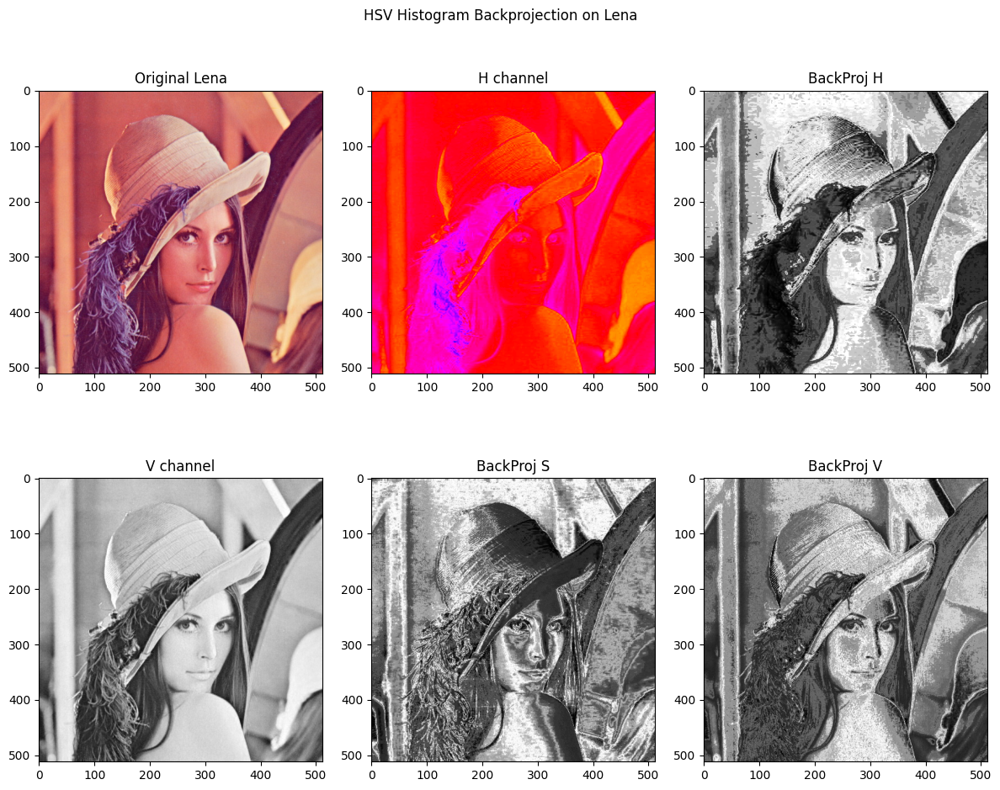

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Load the Lena image (you may need to download 'lena.jpg' or use cv2's sample if available)
# If you don't have Lena, you can download it from OpenCV's GitHub or use another image.
lena_url = "https://raw.githubusercontent.com/opencv/opencv/master/samples/data/lena.jpg"
lena_path = "lena.jpg"

# Download Lena if not present
import os
if not os.path.exists(lena_path):
    import urllib.request
    urllib.request.urlretrieve(lena_url, lena_path)

# Read image and convert to HSV
img = cv2.imread(lena_path)
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

# Split HSV channels
h, s, v = cv2.split(hsv)

# Create histograms for each channel
hist_h = cv2.calcHist([h], [0], None, [180], [0, 180])
hist_s = cv2.calcHist([s], [0], None, [256], [0, 256])
hist_v = cv2.calcHist([v], [0], None, [256], [0, 256])

# Normalize histograms
hist_h = cv2.normalize(hist_h, hist_h, 0, 255, cv2.NORM_MINMAX)
hist_s = cv2.normalize(hist_s, hist_s, 0, 255, cv2.NORM_MINMAX)
hist_v = cv2.normalize(hist_v, hist_v, 0, 255, cv2.NORM_MINMAX)

# Backprojection for each channel
bp_h = cv2.calcBackProject([h], [0], hist_h, [0, 180], 1)
bp_s = cv2.calcBackProject([s], [0], hist_s, [0, 256], 1)
bp_v = cv2.calcBackProject([v], [0], hist_v, [0, 256], 1)

# Plotting results
plt.figure(figsize=(12, 10))
plt.subplot(2,3,1), plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)), plt.title('Original Lena')
plt.subplot(2,3,2), plt.imshow(h, cmap='hsv'), plt.title('H channel')
plt.subplot(2,3,3), plt.imshow(bp_h, cmap='gray'), plt.title('BackProj H')
plt.subplot(2,3,4), plt.imshow(s, cmap='gray'), plt.title('S channel')
plt.subplot(2,3,5), plt.imshow(bp_s, cmap='gray'), plt.title('BackProj S')
plt.subplot(2,3,4), plt.imshow(v, cmap='gray'), plt.title('V channel')
plt.subplot(2,3,6), plt.imshow(bp_v, cmap='gray'), plt.title('BackProj V')
plt.suptitle('HSV Histogram Backprojection on Lena')
plt.tight_layout()
plt.show()

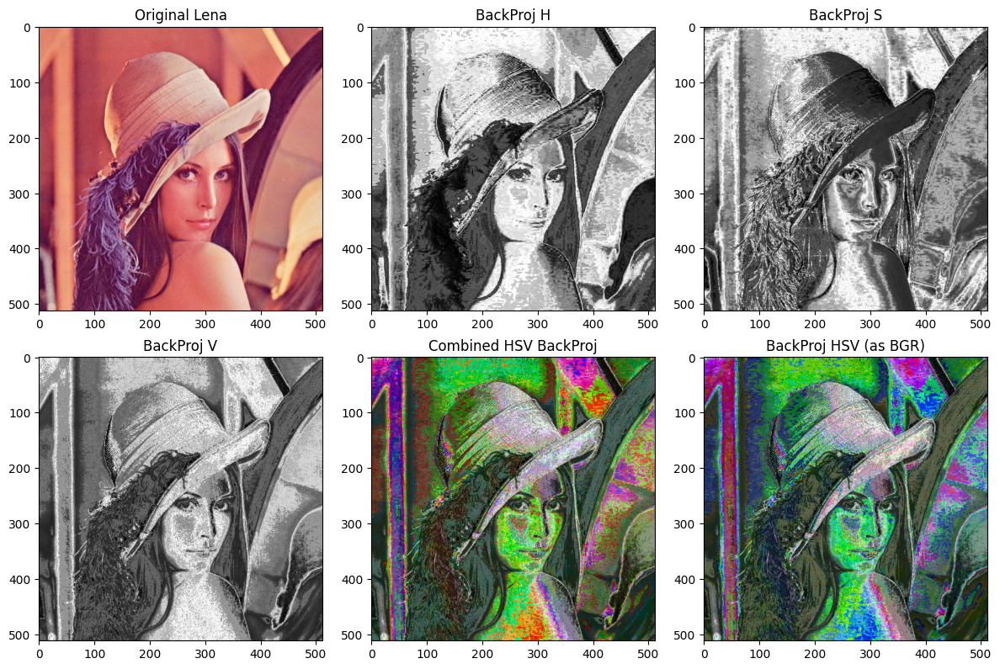

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Load the Lena image (download if not present)
lena_url = "https://raw.githubusercontent.com/opencv/opencv/master/samples/data/lena.jpg"
lena_path = "lena.jpg"
import os
if not os.path.exists(lena_path):
    import urllib.request
    urllib.request.urlretrieve(lena_url, lena_path)

# Read image and convert to HSV
img = cv2.imread(lena_path)
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
h, s, v = cv2.split(hsv)

# Calculate and normalize histograms for each channel
hist_h = cv2.calcHist([h], [0], None, [180], [0, 180])
hist_s = cv2.calcHist([s], [0], None, [256], [0, 256])
hist_v = cv2.calcHist([v], [0], None, [256], [0, 256])
hist_h = cv2.normalize(hist_h, hist_h, 0, 255, cv2.NORM_MINMAX)
hist_s = cv2.normalize(hist_s, hist_s, 0, 255, cv2.NORM_MINMAX)
hist_v = cv2.normalize(hist_v, hist_v, 0, 255, cv2.NORM_MINMAX)

# Backprojection for each channel
bp_h = cv2.calcBackProject([h], [0], hist_h, [0, 180], 1)
bp_s = cv2.calcBackProject([s], [0], hist_s, [0, 256], 1)
bp_v = cv2.calcBackProject([v], [0], hist_v, [0, 256], 1)

# Combine the back projections into a single image (e.g., by multiplication and normalization)
backproj_hsv = cv2.merge([bp_h, bp_s, bp_v])
# For visualization, you might want to normalize and convert to BGR for display
backproj_hsv_norm = cv2.normalize(backproj_hsv, None, 0, 255, cv2.NORM_MINMAX)
backproj_bgr = cv2.cvtColor(backproj_hsv_norm.astype(np.uint8), cv2.COLOR_HSV2BGR)

# Show results
plt.figure(figsize=(12, 8))
plt.subplot(2,3,1), plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)), plt.title('Original Lena')
plt.subplot(2,3,2), plt.imshow(bp_h, cmap='gray'), plt.title('BackProj H')
plt.subplot(2,3,3), plt.imshow(bp_s, cmap='gray'), plt.title('BackProj S')
plt.subplot(2,3,4), plt.imshow(bp_v, cmap='gray'), plt.title('BackProj V')
plt.subplot(2,3,5), plt.imshow(cv2.cvtColor(backproj_hsv_norm.astype(np.uint8), cv2.COLOR_HSV2RGB)), plt.title('Combined HSV BackProj')
plt.subplot(2,3,6), plt.imshow(backproj_bgr), plt.title('BackProj HSV (as BGR)')
plt.tight_layout()
plt.show()

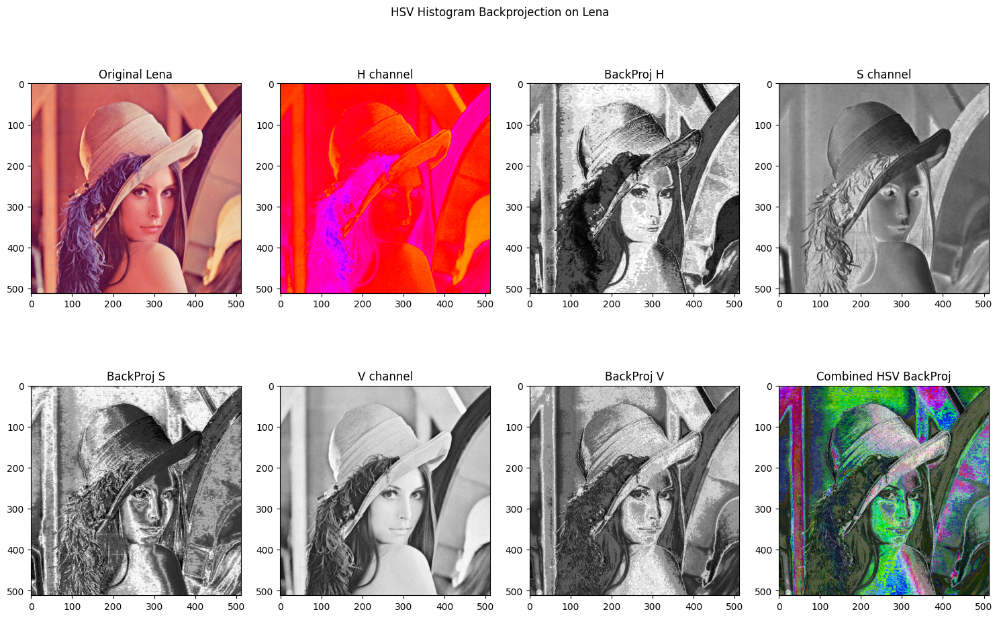

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Load Lena image (download if needed)
lena_url = "https://raw.githubusercontent.com/opencv/opencv/master/samples/data/lena.jpg"
lena_path = "lena.jpg"
import os
if not os.path.exists(lena_path):
    import urllib.request
    urllib.request.urlretrieve(lena_url, lena_path)

img = cv2.imread(lena_path)
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
h, s, v = cv2.split(hsv)

# Calculate and normalize histograms
hist_h = cv2.calcHist([h], [0], None, [180], [0, 180])
hist_s = cv2.calcHist([s], [0], None, [256], [0, 256])
hist_v = cv2.calcHist([v], [0], None, [256], [0, 256])
hist_h = cv2.normalize(hist_h, hist_h, 0, 255, cv2.NORM_MINMAX)
hist_s = cv2.normalize(hist_s, hist_s, 0, 255, cv2.NORM_MINMAX)
hist_v = cv2.normalize(hist_v, hist_v, 0, 255, cv2.NORM_MINMAX)

# Backprojection for each channel
bp_h = cv2.calcBackProject([h], [0], hist_h, [0, 180], 1)
bp_s = cv2.calcBackProject([s], [0], hist_s, [0, 256], 1)
bp_v = cv2.calcBackProject([v], [0], hist_v, [0, 256], 1)

# Combine HSV backprojections by merging channels, then convert to BGR for display
backproj_hsv = cv2.merge([bp_h, bp_s, bp_v])
backproj_hsv_norm = cv2.normalize(backproj_hsv, None, 0, 255, cv2.NORM_MINMAX)
backproj_bgr = cv2.cvtColor(backproj_hsv_norm.astype(np.uint8), cv2.COLOR_HSV2BGR)

# Plotting results
plt.figure(figsize=(15, 10))
plt.subplot(2,4,1), plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)), plt.title('Original Lena')
plt.subplot(2,4,2), plt.imshow(h, cmap='hsv'), plt.title('H channel')
plt.subplot(2,4,3), plt.imshow(bp_h, cmap='gray'), plt.title('BackProj H')
plt.subplot(2,4,4), plt.imshow(s, cmap='gray'), plt.title('S channel')
plt.subplot(2,4,5), plt.imshow(bp_s, cmap='gray'), plt.title('BackProj S')
plt.subplot(2,4,6), plt.imshow(v, cmap='gray'), plt.title('V channel')
plt.subplot(2,4,7), plt.imshow(bp_v, cmap='gray'), plt.title('BackProj V')
plt.subplot(2,4,8), plt.imshow(backproj_bgr), plt.title('Combined HSV BackProj')
plt.suptitle('HSV Histogram Backprojection on Lena')
plt.tight_layout()
plt.show()

# HSV x LBP

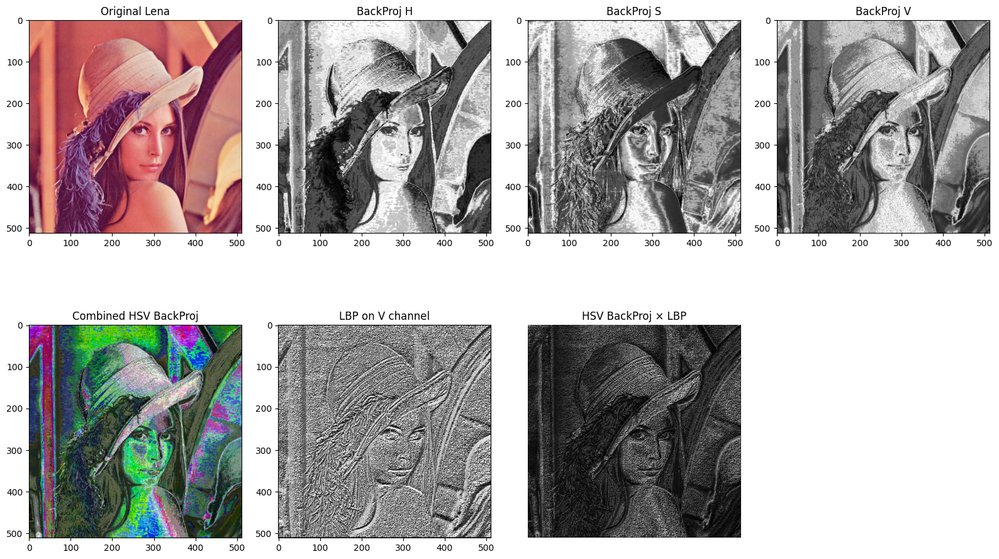

In [ ]:
import cv2
import numpy as np
from skimage.feature import local_binary_pattern
from matplotlib import pyplot as plt
import os

# Download Lena if not present
lena_url = "https://raw.githubusercontent.com/opencv/opencv/master/samples/data/lena.jpg"
lena_path = "lena.jpg"
if not os.path.exists(lena_path):
    import urllib.request
    urllib.request.urlretrieve(lena_url, lena_path)

# Load image and convert to HSV
img = cv2.imread(lena_path)
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
h, s, v = cv2.split(hsv)

# Calculate and normalize histograms for each channel
hist_h = cv2.calcHist([h], [0], None, [180], [0, 180])
hist_s = cv2.calcHist([s], [0], None, [256], [0, 256])
hist_v = cv2.calcHist([v], [0], None, [256], [0, 256])
hist_h = cv2.normalize(hist_h, hist_h, 0, 255, cv2.NORM_MINMAX)
hist_s = cv2.normalize(hist_s, hist_s, 0, 255, cv2.NORM_MINMAX)
hist_v = cv2.normalize(hist_v, hist_v, 0, 255, cv2.NORM_MINMAX)

# Backprojection for each channel
bp_h = cv2.calcBackProject([h], [0], hist_h, [0, 180], 1)
bp_s = cv2.calcBackProject([s], [0], hist_s, [0, 256], 1)
bp_v = cv2.calcBackProject([v], [0], hist_v, [0, 256], 1)

# Combine HSV backprojections by merging channels, then convert to BGR for display
backproj_hsv = cv2.merge([bp_h, bp_s, bp_v])
backproj_hsv_norm = cv2.normalize(backproj_hsv, None, 0, 255, cv2.NORM_MINMAX)
backproj_bgr = cv2.cvtColor(backproj_hsv_norm.astype(np.uint8), cv2.COLOR_HSV2BGR)

# Compute LBP on the V channel (brightness), classic 8-point, radius=1
P, R = 8, 1
lbp_v = local_binary_pattern(v, P, R, method='default')

# Normalize LBP to 0-255 for visualization and combination
lbp_v_norm = cv2.normalize(lbp_v, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

# Combine HSV backprojection and LBP: Elementwise multiplication (as mask)
# Convert backproj_bgr to grayscale for combination
backproj_gray = cv2.cvtColor(backproj_bgr, cv2.COLOR_BGR2GRAY)
combined = cv2.multiply(backproj_gray, lbp_v_norm, scale=1.0/255)

# Plot all results
plt.figure(figsize=(16, 10))
plt.subplot(2,4,1), plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)), plt.title('Original Lena')
plt.subplot(2,4,2), plt.imshow(bp_h, cmap='gray'), plt.title('BackProj H')
plt.subplot(2,4,3), plt.imshow(bp_s, cmap='gray'), plt.title('BackProj S')
plt.subplot(2,4,4), plt.imshow(bp_v, cmap='gray'), plt.title('BackProj V')
plt.subplot(2,4,5), plt.imshow(backproj_bgr), plt.title('Combined HSV BackProj')
plt.subplot(2,4,6), plt.imshow(lbp_v_norm, cmap='gray'), plt.title('LBP on V channel')
plt.subplot(2,4,7), plt.imshow(combined, cmap='gray'), plt.title('HSV BackProj × LBP')
plt.axis('off')
plt.tight_layout()
plt.show()

In [ ]:
print("Sample pixel values (row, col):")
sample_coords = [(100,100), (200,200), (256,256)]
for (row, col) in sample_coords:
    if row < combined.shape[0] and col < combined.shape[1]:
        print(f"At ({row},{col}):")
        print(f"  Original RGB: {img[row, col]}")
        print(f"  HSV: {[h[row, col], s[row, col], v[row, col]]}")
        print(f"  BackProj_HSV: {backproj_hsv[row, col]}")
        print(f"  LBP(V): {lbp_v[row, col]}")
        print(f"  Combined: {combined[row, col]}")
    else:
        print(f"Coordinate ({row},{col}) is out of bounds for this image.")


Sample pixel values (row, col):
At (100,100):
  Original RGB: [ 87  74 182]
  HSV: [np.uint8(176), np.uint8(151), np.uint8(182)]
  BackProj_HSV: [188 167  95]
  LBP(V): 0.0
  Combined: 0
At (200,200):
  Original RGB: [ 90  48 131]
  HSV: [np.uint8(165), np.uint8(162), np.uint8(131)]
  BackProj_HSV: [ 83 118  40]
  LBP(V): 30.0
  Combined: 4
At (256,256):
  Original RGB: [ 74  65 181]
  HSV: [np.uint8(178), np.uint8(163), np.uint8(181)]
  BackProj_HSV: [234 109 101]
  LBP(V): 14.0
  Combined: 5


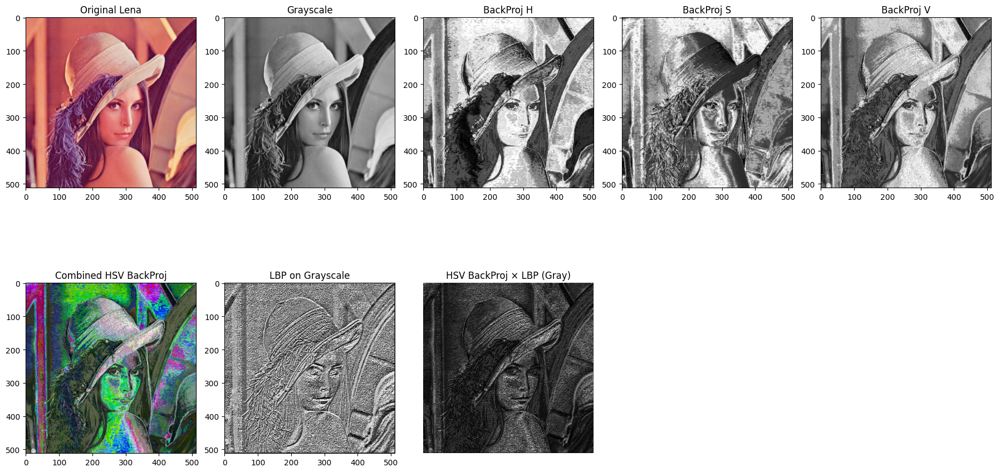

In [ ]:
import cv2
import numpy as np
from skimage.feature import local_binary_pattern
from matplotlib import pyplot as plt
import os

# Download Lena if not present
lena_url = "https://raw.githubusercontent.com/opencv/opencv/master/samples/data/lena.jpg"
lena_path = "lena.jpg"
if not os.path.exists(lena_path):
    import urllib.request
    urllib.request.urlretrieve(lena_url, lena_path)

# Load image (BGR)
img = cv2.imread(lena_path)

# Convert to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Convert to HSV and split
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
h, s, v = cv2.split(hsv)

# Calculate and normalize histograms for each channel
hist_h = cv2.calcHist([h], [0], None, [180], [0, 180])
hist_s = cv2.calcHist([s], [0], None, [256], [0, 256])
hist_v = cv2.calcHist([v], [0], None, [256], [0, 256])
hist_h = cv2.normalize(hist_h, hist_h, 0, 255, cv2.NORM_MINMAX)
hist_s = cv2.normalize(hist_s, hist_s, 0, 255, cv2.NORM_MINMAX)
hist_v = cv2.normalize(hist_v, hist_v, 0, 255, cv2.NORM_MINMAX)

# Backprojection for each channel
bp_h = cv2.calcBackProject([h], [0], hist_h, [0, 180], 1)
bp_s = cv2.calcBackProject([s], [0], hist_s, [0, 256], 1)
bp_v = cv2.calcBackProject([v], [0], hist_v, [0, 256], 1)

# Combine HSV backprojections by merging channels, then convert to BGR for display
backproj_hsv = cv2.merge([bp_h, bp_s, bp_v])
backproj_hsv_norm = cv2.normalize(backproj_hsv, None, 0, 255, cv2.NORM_MINMAX)
backproj_bgr = cv2.cvtColor(backproj_hsv_norm.astype(np.uint8), cv2.COLOR_HSV2BGR)

# LBP on grayscale image
P, R = 8, 1
lbp_gray = local_binary_pattern(gray, P, R, method='default')
lbp_gray_norm = cv2.normalize(lbp_gray, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

# Combine HSV backprojection and grayscale LBP (e.g. elementwise multiplication)
backproj_gray = cv2.cvtColor(backproj_bgr, cv2.COLOR_BGR2GRAY)
combined = cv2.multiply(backproj_gray, lbp_gray_norm, scale=1.0/255)

# Plot all results
plt.figure(figsize=(18, 10))
plt.subplot(2,5,1), plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)), plt.title('Original Lena')
plt.subplot(2,5,2), plt.imshow(gray, cmap='gray'), plt.title('Grayscale')
plt.subplot(2,5,3), plt.imshow(bp_h, cmap='gray'), plt.title('BackProj H')
plt.subplot(2,5,4), plt.imshow(bp_s, cmap='gray'), plt.title('BackProj S')
plt.subplot(2,5,5), plt.imshow(bp_v, cmap='gray'), plt.title('BackProj V')
plt.subplot(2,5,6), plt.imshow(backproj_bgr), plt.title('Combined HSV BackProj')
plt.subplot(2,5,7), plt.imshow(lbp_gray_norm, cmap='gray'), plt.title('LBP on Grayscale')
plt.subplot(2,5,8), plt.imshow(combined, cmap='gray'), plt.title('HSV BackProj × LBP (Gray)')
plt.axis('off')
plt.tight_layout()
plt.show()

In [ ]:
rows, cols = combined.shape
for row in range(rows):
    for col in range(cols):
        print(f"Pixel ({row},{col}): {combined[row, col]}")

Streaming output truncated to the last 5000 lines.
Pixel (502,120): 31
Pixel (502,121): 13
Pixel (502,122): 8
Pixel (502,123): 45
Pixel (502,124): 54
Pixel (502,125): 19
Pixel (502,126): 0
Pixel (502,127): 26
Pixel (502,128): 10
Pixel (502,129): 17
Pixel (502,130): 43
Pixel (502,131): 23
Pixel (502,132): 18
Pixel (502,133): 26
Pixel (502,134): 14
Pixel (502,135): 50
Pixel (502,136): 17
Pixel (502,137): 17
Pixel (502,138): 1
Pixel (502,139): 15
Pixel (502,140): 53
Pixel (502,141): 0
Pixel (502,142): 42
Pixel (502,143): 18
Pixel (502,144): 5
Pixel (502,145): 22
Pixel (502,146): 43
Pixel (502,147): 0
Pixel (502,148): 2
Pixel (502,149): 63
Pixel (502,150): 17
Pixel (502,151): 0
Pixel (502,152): 17
Pixel (502,153): 44
Pixel (502,154): 12
Pixel (502,155): 40
Pixel (502,156): 73
Pixel (502,157): 7
Pixel (502,158): 34
Pixel (502,159): 39
Pixel (502,160): 19
Pixel (502,161): 0
Pixel (502,162): 4
Pixel (502,163): 3
Pixel (502,164): 36
Pixel (502,165): 52
Pixel (502,166): 55
Pixel (502,167): 7
Pi

In [ ]:
# Create a new array and fill it with the pixel values from combined
rows, cols = combined.shape
new_array = np.zeros((rows, cols), dtype=combined.dtype)
for row in range(rows):
    for col in range(cols):
        new_array[row, col] = combined[row, col]

# (Optional) Show that new_array and combined are the same
print("Are new_array and combined equal?", np.array_equal(new_array, combined))

Are new_array and combined equal? True


In [ ]:

# Save the new array as an image
cv2.imwrite('new_array_image.png', new_array)
print("Saved new_array as 'new_array_image.png'")

Saved new_array as 'new_array_image.png'
